In [1]:
import os
import math

import matplotlib
import numpy as np
import sys
import yaml

sys.path.append('../')
import torch


import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from sklearn.decomposition import PCA
from matplotlib import cm

from model import RecurrentNeuralNetwork
from posterior_inference_dataset import Posterior

%matplotlib inline

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
g_1, g_2 = np.random.rand(2) + 0.25

In [4]:
def make_signal_cc_task(N, time_length, mu_min, mu_max, uncertainty,fix_input=False, same_mean=False):
    input_signals = np.zeros([N, time_length, 200])
    phi = np.linspace(-20, 20, 100)
    sigma_sq = 5
    mu_post_list = []
    sigma_post_list = []
    for i in range(N):
        signal1_input = np.zeros([time_length, 100])
        signal2_input = np.zeros([time_length, 100])
        mu = np.random.rand() * (mu_max - mu_min) + mu_min
        # g_1, g_2 = np.random.choice([0.25, 0.5, 0.75, 1.0, 1.25], size=2)
        g_1, g_2 = np.random.rand(2) + 0.25
        g_2 = g_1
        signal1_base = g_1 * np.exp(-(mu - phi) ** 2 / (2.0 * sigma_sq))
        signal2_base = g_2 * np.exp(-(mu - phi) ** 2 / (2.0 * sigma_sq))
        for t in range(time_length):
            signal1_input[t] = np.random.poisson(signal1_base)
        for t in range(time_length):
            signal2_input[t] = np.random.poisson(signal2_base)
        if fix_input:
            tmp1 = np.random.poisson(signal1_base)
            tmp2 = np.random.poisson(signal2_base)
            for t in range(time_length):
                signal1_input[t] = tmp1
                signal2_input[t] = tmp2
            
        # target
        sigma_1 = np.sqrt(1 / g_1) * uncertainty
        sigma_2 = np.sqrt(1 / g_2) * uncertainty
        mu_posterior = ((sigma_1 ** 2) * mu +
                        (sigma_2 ** 2) * mu) / (sigma_1 ** 2 + sigma_2 ** 2)
        g_3 = g_1 + g_2
        sigma_posterior = np.sqrt(1 / g_3) * uncertainty
        
        input_signals[i] = np.concatenate((signal1_input, signal2_input), axis=1)
        
        mu_post_list.append(mu_posterior)
        sigma_post_list.append(sigma_posterior)

    return input_signals, mu_post_list, sigma_post_list

In [5]:
config_path = '../cfg/cue_combination_sampling/20_1.cfg'
with open(config_path, 'r') as f:
    cfg = yaml.safe_load(f)
    

In [6]:
print(cfg['MODEL']['SIGMA_NEU'])

0


In [7]:
torch.manual_seed(1)
device = torch.device('cpu')

In [8]:
model_name = os.path.splitext(os.path.basename(config_path))[0]
print('model_name: ', model_name)

if 'ALPHA' not in cfg['MODEL'].keys():
    cfg['MODEL']['ALPHA'] = 0.25
    
# cfg['MODEL']['SIGMA_NEU'] = 0.05
cfg['DATALOADER']['TIME_LENGTH'] = 60

model = RecurrentNeuralNetwork(n_in=200, n_out=1, n_hid=cfg['MODEL']['SIZE'], device=device,
                               alpha_time_scale=cfg['MODEL']['ALPHA'], 
                               activation=cfg['MODEL']['ACTIVATION'],
                               sigma_neu=cfg['MODEL']['SIGMA_NEU'],
                               use_bias=cfg['MODEL']['USE_BIAS'],
                               ffnn=False).to(device)

model_path = f'../trained_model/cue_combination_sampling/{model_name}/epoch_1000.pth'
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

model_name:  20_1


RecurrentNeuralNetwork(
  (w_in): Linear(in_features=200, out_features=200, bias=True)
  (w_hh): Linear(in_features=200, out_features=200, bias=True)
  (w_out): Linear(in_features=200, out_features=1, bias=True)
)

In [9]:
"""
new_w_in_weight = np.random.normal(-0.0562, 0.1123, 200**2).reshape(200, 200)
new_w_in_bias = np.random.normal(0.12, 0.21, 200)

model.w_in.weight = torch.nn.Parameter(torch.from_numpy(new_w_in_weight).float())
model.w_in.bias = torch.nn.Parameter(torch.from_numpy(new_w_in_bias).float())
"""

'\nnew_w_in_weight = np.random.normal(-0.0562, 0.1123, 200**2).reshape(200, 200)\nnew_w_in_bias = np.random.normal(0.12, 0.21, 200)\n\nmodel.w_in.weight = torch.nn.Parameter(torch.from_numpy(new_w_in_weight).float())\nmodel.w_in.bias = torch.nn.Parameter(torch.from_numpy(new_w_in_bias).float())\n'

In [10]:
sample_num = 1000

outputs_np = np.zeros(sample_num)
input_signal, mu_post_list, sigma_post_list = make_signal_cc_task(sample_num, 
                                                                  time_length=cfg['DATALOADER']['TIME_LENGTH'], 
                                                                  mu_min=-5,
                                                                  mu_max=5,
                                                                  uncertainty=cfg['DATALOADER']['UNCERTAINTY'],
                                                                  fix_input=False)
input_signal_split = np.split(input_signal, sample_num // cfg['TRAIN']['BATCHSIZE'])

In [11]:
neural_dynamics = np.zeros((sample_num, cfg['DATALOADER']['TIME_LENGTH'], model.n_hid))                                                                        

hidden_np = np.zeros((sample_num, cfg['MODEL']['SIZE']))
hidden = torch.from_numpy(hidden_np).float()                               
hidden = hidden.to(device)                                                                             
inputs = torch.from_numpy(input_signal).float()                                               
inputs = inputs.to(device)                                                                             
hidden_list, outputs, _ = model(inputs, hidden, cfg['DATALOADER']['TIME_LENGTH'])                                                     
neural_dynamics = hidden_list.cpu().detach().numpy()                          
# outputs_np[i * cfg['TRAIN']['BATCHSIZE']: (i + 1) * cfg['TRAIN']['BATCHSIZE']] = outputs.detach().numpy()[:, -1, 0]
# neural_dynamics[i * cfg['TRAIN']['BATCHSIZE']: (i + 1) * cfg['TRAIN']['BATCHSIZE']] = hidden_list_np   

In [12]:
w_in_weight = model.w_in.weight.data.numpy().reshape(200**2)

Text(0.5, 0, '$W_{ij}$')

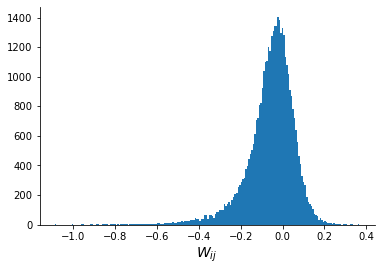

In [13]:
plt.hist(w_in_weight, bins=200)

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel(r'$W_{ij}$', fontsize=14)
# plt.savefig('figures/20_1_w_in_distribution.eps', dpi=150)

In [14]:
print(np.mean(model.w_in.weight.data.numpy()))
print(np.std(model.w_in.weight.data.numpy()))

-0.0562828
0.11232497


In [15]:
print(np.mean(model.w_hh.weight.data.numpy()))
print(np.std(model.w_hh.weight.data.numpy()))

-0.020887008
0.107178375


In [16]:
print(np.mean(model.w_in.bias.data.numpy()))
print(np.std(model.w_in.bias.data.numpy()))

0.1206812
0.21083745


In [17]:
print(np.mean(model.w_hh.bias.data.numpy()))
print(np.std(model.w_hh.bias.data.numpy()))

0.12006497
0.21083885


In [18]:
os.makedirs('figures', exist_ok=True)

In [48]:
input_signal.shape

(1000, 60, 200)

In [51]:
input_signal_fix = input_signal.copy()
for i in range(1, 60):
    input_signal_fix[:, i] = input_signal[:, 0]

In [52]:
input_signal2 = input_signal.copy()
for i in range(30, 60):
    input_signal2[:, i] = input_signal[:, 1]

In [53]:
neural_dynamics_2 = np.zeros((sample_num, cfg['DATALOADER']['TIME_LENGTH'], model.n_hid))                                                                        

hidden_np = np.zeros((sample_num, cfg['MODEL']['SIZE']))
hidden = torch.from_numpy(hidden_np).float()                               
hidden = hidden.to(device)                                                                             
inputs = torch.from_numpy(input_signal2).float()                                               
inputs = inputs.to(device)                                                                             
hidden_list, outputs_2, _ = model(inputs, hidden, cfg['DATALOADER']['TIME_LENGTH'])                                                     
neural_dynamics_2 = hidden_list.cpu().detach().numpy()                          
# outputs_np[i * cfg['TRAIN']['BATCHSIZE']: (i + 1) * cfg['TRAIN']['BATCHSIZE']] = outputs.detach().numpy()[:, -1, 0]
# neural_dynamics[i * cfg['TRAIN']['BATCHSIZE']: (i + 1) * cfg['TRAIN']['BATCHSIZE']] = hidden_list_np   

In [54]:
neural_dynamics_fix = np.zeros((sample_num, cfg['DATALOADER']['TIME_LENGTH'], model.n_hid))                                                                        

hidden_np = np.zeros((sample_num, cfg['MODEL']['SIZE']))
hidden = torch.from_numpy(hidden_np).float()                               
hidden = hidden.to(device)                                                                             
inputs = torch.from_numpy(input_signal_fix).float()                                               
inputs = inputs.to(device)                                                                             
hidden_list, outputs_fix, _ = model(inputs, hidden, cfg['DATALOADER']['TIME_LENGTH'])                                                     
neural_dynamics_fix = hidden_list.cpu().detach().numpy()                          
# outputs_np[i * cfg['TRAIN']['BATCHSIZE']: (i + 1) * cfg['TRAIN']['BATCHSIZE']] = outputs.detach().numpy()[:, -1, 0]
# neural_dynamics[i * cfg['TRAIN']['BATCHSIZE']: (i + 1) * cfg['TRAIN']['BATCHSIZE']] = hidden_list_np   

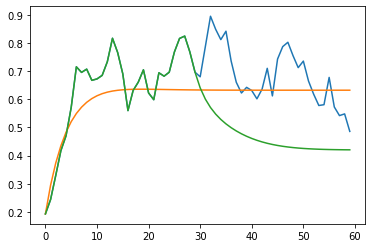

In [55]:
plt.plot(neural_dynamics[0, :, 28])
plt.plot(neural_dynamics_fix[0, :, 28])
plt.plot(neural_dynamics_2[0, :, 28])

Text(0, 0.5, '$h_i(t)$')

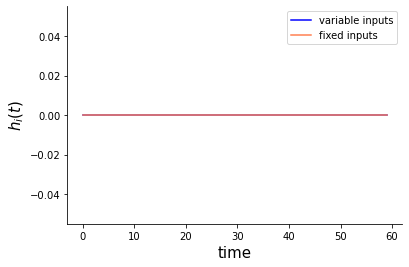

In [30]:
plt.plot(neural_dynamics[0, :, 28], color='blue', label='variable inputs')
plt.plot(neural_dynamics_fix[0, :, 28], color='coral', label='fixed inputs')


plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.legend()

plt.xlabel('time', fontsize=15)
plt.ylabel(r'$h_i(t)$', fontsize=15)

# plt.savefig('figures/20_1_hidden_neuron_dynamics.eps', dpi=150)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


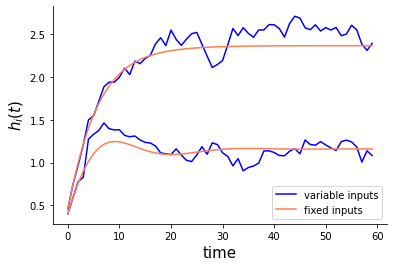

In [133]:
plt.plot(neural_dynamics[0, :, 28], color='blue', label='variable inputs')
plt.plot(neural_dynamics_fix[0, :, 28], color='coral', label='fixed inputs')
plt.plot(neural_dynamics[1, :, 28], color='blue')
plt.plot(neural_dynamics_fix[1, :, 28], color='coral')


plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.legend()

plt.xlabel('time', fontsize=15)
plt.ylabel(r'$h_i(t)$', fontsize=15)

plt.savefig('figures/20_1_hidden_neuron_dynamics.eps', dpi=150)

In [56]:
neural_dynamics_all = neural_dynamics_fix[:, :, :].reshape(sample_num*60, model.n_hid)

In [57]:
pca.explained_variance_ratio_

array([1.0006266e+00, 1.1868748e-08, 1.8084685e-09], dtype=float32)

/Users/kohei/.pyenv/versions/anaconda3-5.1.0/lib/python3.6/site-packages/ipykernel_launcher.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


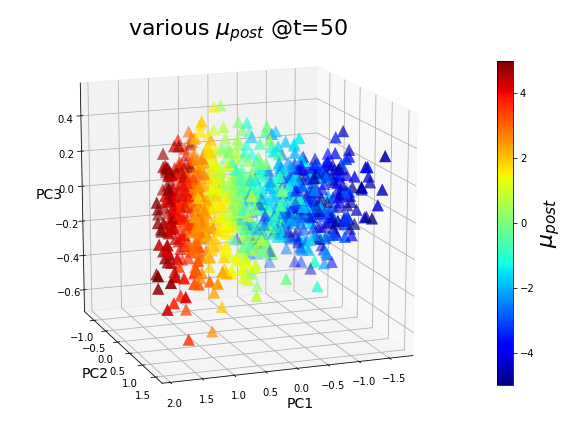

In [58]:
time_stamp = 50
pca = PCA(n_components=3)
# pca.fit(neural_dynamics[:, time_stamp, :])
pca.fit(neural_dynamics_all)

fig = plt.figure(figsize=(8, 6))
ax = Axes3D(fig)
ax.view_init(elev=15, azim=70)

# 軸ラベルの設定
ax.set_xlabel('PC1', fontsize=14)
ax.set_ylabel('PC2', fontsize=14)
ax.set_zlabel('PC3', fontsize=14)

trajectory_list = np.zeros((sample_num, cfg['DATALOADER']['TIME_LENGTH'], 3))
for i in range(sample_num):
    trajectory = pca.transform(neural_dynamics[i])
    trajectory_list[i, :] = trajectory
    
mu_post = ax.scatter(trajectory_list[::, time_stamp, 0], trajectory_list[::, time_stamp, 1], 
                     trajectory_list[::, time_stamp, 2], 
                     c=mu_post_list[::], 
                     cmap=cm.jet, s=150, marker='^', lw=0, zorder=2)

cbar = fig.colorbar(mu_post, shrink = 0.75)
cbar.set_label(r'$\mu_{post}$', fontsize=22)
plt.title(r'various $\mu_{post}$ '+ f'@t={time_stamp}', fontsize=22)

plt.tight_layout()
# plt.savefig('figures/20_1_fixed_points_mean.png', dpi=150)

Text(0.5, 0.92, 'various $\\sigma_{post}$ @t=50')

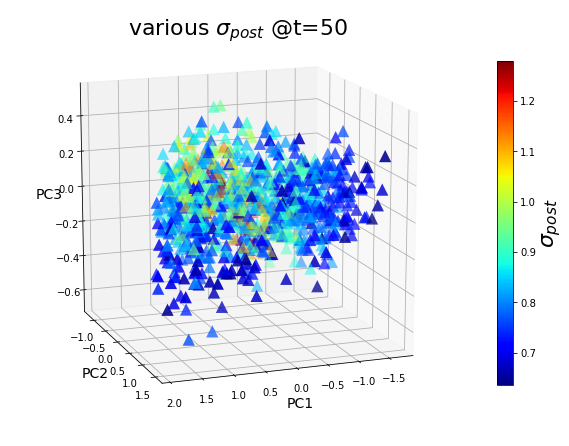

In [59]:
time_stamp = 50
pca = PCA(n_components=3)
# pca.fit(neural_dynamics[:, time_stamp, :])
pca.fit(neural_dynamics_all)

fig = plt.figure(figsize=(8, 6))
ax = Axes3D(fig)
ax.view_init(elev=15, azim=70)

# 軸ラベルの設定
ax.set_xlabel('PC1', fontsize=14)
ax.set_ylabel('PC2', fontsize=14)
ax.set_zlabel('PC3', fontsize=14)

trajectory_list = np.zeros((sample_num, cfg['DATALOADER']['TIME_LENGTH'], 3))
for i in range(sample_num):
    trajectory = pca.transform(neural_dynamics[i])
    trajectory_list[i, :] = trajectory
    
mu_post = ax.scatter(trajectory_list[::, time_stamp, 0], trajectory_list[::, time_stamp, 1], 
                     trajectory_list[::, time_stamp, 2], 
                     c=sigma_post_list[::], 
                     cmap=cm.jet, s=150, marker='^', lw=0, zorder=2)

cbar = fig.colorbar(mu_post, shrink = 0.75)
cbar.set_label(r'$\sigma_{post}$', fontsize=22)
plt.title(r'various $\sigma_{post}$ '+ f'@t={time_stamp}', fontsize=22)

# plt.savefig('figures/20_1_fixed_points_sigma.png', dpi=150)

Text(0, 0.5, "$E_i [{\\rm std}_t (h_i\\'(t))]$")

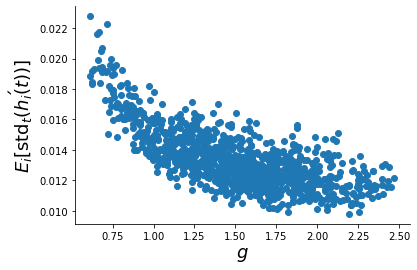

In [60]:
plt.scatter(
    1 / np.array(sigma_post_list) ** 2, 
    np.mean(np.std(neural_dynamics[:, :, :], axis=1), axis=1),
)
# plt.xlim([0, 1.5])

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel(r'$g$', fontsize=18)
plt.ylabel(r'$E_i [{\rm std}_t (h_i\'(t))]$', fontsize=18)

# plt.savefig('figures/20_1_g_hidden_scatter.png', dpi=150)


In [61]:
diff_coefficient = [1 if neural_dynamics_fix[0, 50, i]>0 else 0 for i in range(200) ]


In [62]:
w_hh = model.w_hh.weight.data.numpy()
jacobian = np.zeros((200, 200))
for i in range(200):
    for j in range(200):
        jacobian[i, j] = diff_coefficient[j] * w_hh[i, j]
        if i == j:
            jacobian[i, j] -= 1

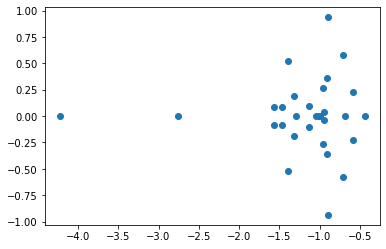

In [63]:
w, v = np.linalg.eig(jacobian)
plt.scatter(w.real, w.imag)

In [64]:
np.max(w.real)

-0.4408614086358904

In [65]:
sigma_post_list[3]

0.8644976382726065

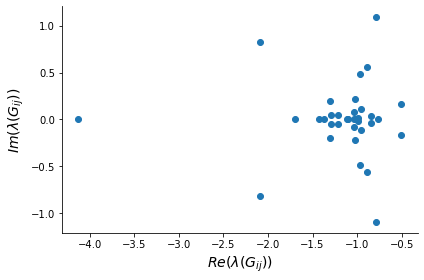

In [66]:
diff_coefficient = [1 if neural_dynamics_fix[3, 50, i]>0 else 0 for i in range(200) ]

w_hh = model.w_hh.weight.data.numpy()
jacobian = np.zeros((200, 200))
for i in range(200):
    for j in range(200):
        jacobian[i, j] = diff_coefficient[j] * w_hh[i, j]
        if i == j:
            jacobian[i, j] -= 1
            
w, v = np.linalg.eig(jacobian)
plt.scatter(w.real, w.imag)

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel(r'$Re(\lambda(G_{ij}))$', fontsize=14)
plt.ylabel(r'$Im(\lambda(G_{ij}))$', fontsize=14)

plt.tight_layout()
# plt.savefig('figures/20_1_sample_eigenvalues_dist.png', dpi=150)

In [171]:
np.max(w.real)

-0.5706291687070641

In [84]:
sample_num = 500

outputs_np = np.zeros(sample_num)
input_signal, mu_post_list, sigma_post_list = make_signal_cc_task(sample_num, 
                                                                  time_length=cfg['DATALOADER']['TIME_LENGTH'], 
                                                                  mu_min=5,
                                                                  mu_max=5,
                                                                  uncertainty=cfg['DATALOADER']['UNCERTAINTY'])
input_signal_split = np.split(input_signal, sample_num // cfg['TRAIN']['BATCHSIZE'])

In [85]:
input_signal_fix = input_signal.copy()
for i in range(1, 60):
    input_signal_fix[:, i] = input_signal[:, 0]

In [86]:
neural_dynamics_fix = np.zeros((sample_num, cfg['DATALOADER']['TIME_LENGTH'], model.n_hid))                                                                        

hidden_np = np.zeros((sample_num, cfg['MODEL']['SIZE']))
hidden = torch.from_numpy(hidden_np).float()                               
hidden = hidden.to(device)                                                                             
inputs = torch.from_numpy(input_signal_fix).float()                                               
inputs = inputs.to(device)                                                                             
hidden_list, outputs_fix, _ = model(inputs, hidden, cfg['DATALOADER']['TIME_LENGTH'])                                                     
neural_dynamics_fix = hidden_list.cpu().detach().numpy()                          
# outputs_np[i * cfg['TRAIN']['BATCHSIZE']: (i + 1) * cfg['TRAIN']['BATCHSIZE']] = outputs.detach().numpy()[:, -1, 0]
# neural_dynamics[i * cfg['TRAIN']['BATCHSIZE']: (i + 1) * cfg['TRAIN']['BATCHSIZE']] = hidden_list_np   

In [92]:
lambda_max_list = []
lambda_real_list = []
w_hh = model.w_hh.weight.data.numpy()
for k in range(500):
    diff_coefficient = [1 if neural_dynamics_fix[k, 50, i]>0 else 0 for i in range(200) ]


    jacobian = np.zeros((200, 200))
    for i in range(200):
        for j in range(200):
            jacobian[i, j] = diff_coefficient[j] * w_hh[i, j]
            if i == j:
                jacobian[i, j] -= 1
            
    w, v = np.linalg.eig(jacobian)
    lambda_max_list.append(np.max(w.real))
    lambda_real_list.append(w.real.tolist())

In [94]:
np.array(lambda_real_list).shape

(500, 200)

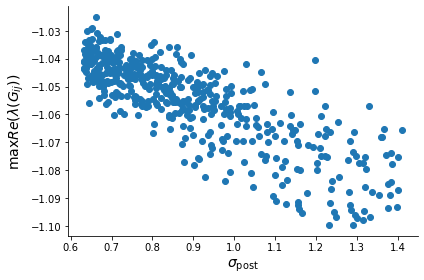

In [95]:
plt.scatter(
    np.array(sigma_post_list), 
    np.mean(np.array(lambda_real_list), axis=1),
)

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel(r'$\sigma_{\rm post}$', fontsize=14)
plt.ylabel(r'$\max Re(\lambda(G_{ij}))$', fontsize=14)

plt.tight_layout()
# plt.savefig('figures/20_1_max_eigenvalues_scatter.png', dpi=150)

In [110]:
np.array(lambda_real_list).shape

(500, 200)

In [117]:
np.sort(np.array(lambda_real_list), axis=1)[:10, -1]

array([-0.61828393,  0.01023527, -0.40512024, -0.43603739, -0.37066269,
        0.0244297 , -0.48979497, -0.53507281, -0.50725956, -0.44959801])

In [119]:
lambda_max_list[:10]

[-0.6182839337385477,
 0.0102352650359226,
 -0.4051202408208405,
 -0.4360373944081769,
 -0.3706626922268057,
 0.02442969869253337,
 -0.4897949717269727,
 -0.5350728082194094,
 -0.5072595644108423,
 -0.4495980059725576]

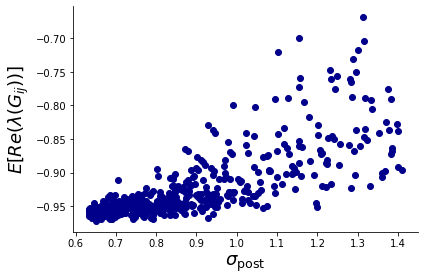

In [135]:
plt.scatter(
    np.array(sigma_post_list), 
    np.mean(np.sort(np.array(lambda_real_list), axis=1)[:, -50:], axis=1),
    color='darkblue'
)

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel(r'$\sigma_{\rm post}$', fontsize=18)
plt.ylabel(r'$E[Re(\lambda(G_{ij}))]$', fontsize=18)

plt.tight_layout()
plt.savefig('figures/20_1_large_eigenvalues_scatter.png', dpi=150)

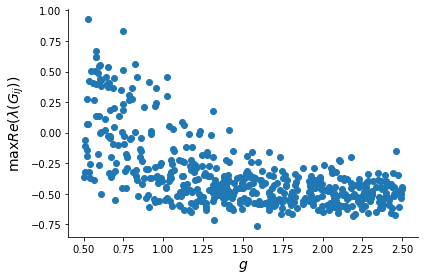

In [116]:
plt.scatter(
    1 / np.array(sigma_post_list) ** 2, 
    lambda_max_list,
)

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel(r'$g$', fontsize=14)
plt.ylabel(r'$\max Re(\lambda(G_{ij}))$', fontsize=14)

plt.tight_layout()
# plt.savefig('figures/20_1_max_eigenvalues_scatter.png', dpi=150)

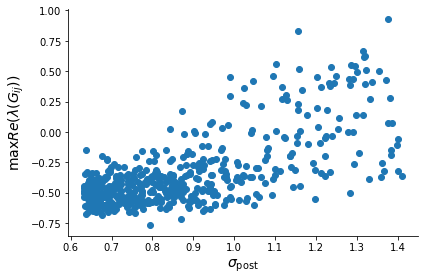

In [93]:
plt.scatter(
    np.array(sigma_post_list), 
    lambda_max_list,
)

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel(r'$\sigma_{\rm post}$', fontsize=14)
plt.ylabel(r'$\max Re(\lambda(G_{ij}))$', fontsize=14)

plt.tight_layout()
# plt.savefig('figures/20_1_max_eigenvalues_scatter.png', dpi=150)

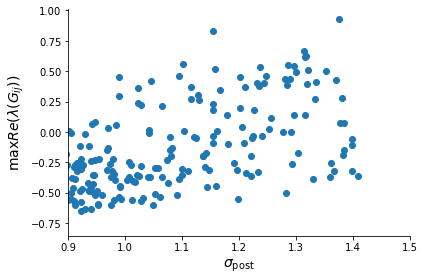

In [91]:
plt.scatter(
    np.array(sigma_post_list), 
    lambda_max_list,
)

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel(r'$\sigma_{\rm post}$', fontsize=14)
plt.ylabel(r'$\max Re(\lambda(G_{ij}))$', fontsize=14)

plt.xlim([0.9, 1.5])
plt.tight_layout()
# plt.savefig('figures/20_1_max_eigenvalues_scatter.png', dpi=150)

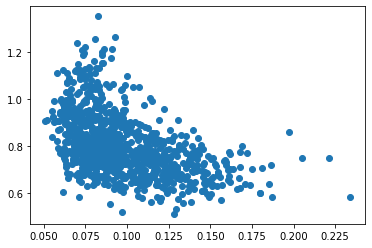

In [73]:
mean_dynamics = np.mean(neural_dynamics, axis=1)
var_dynamics = neural_dynamics - np.expand_dims(mean_dynamics, axis=1)
plt.scatter(
    np.mean(np.linalg.norm(var_dynamics**2, axis=2), axis=1), 
    np.std(outputs.detach().numpy()[:, :, 0], axis=1),
)
plt.show()

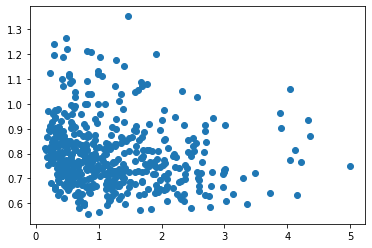

In [82]:
mean_dynamics = np.mean(neural_dynamics, axis=1)
var_dynamics = neural_dynamics[:500] - neural_dynamics_fix
plt.scatter(
    np.mean(np.linalg.norm(var_dynamics**2, axis=2), axis=1), 
    np.std(outputs.detach().numpy()[:500, :, 0], axis=1),
)
plt.show()

In [77]:
len(sigma_post_list)

500

In [78]:
len(np.mean(np.linalg.norm(var_dynamics**2, axis=2), axis=1))

1000

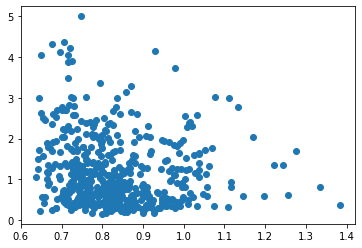

In [81]:
mean_dynamics = np.mean(neural_dynamics, axis=1)
var_dynamics = neural_dynamics[:500] - neural_dynamics_fix
plt.scatter(
    sigma_post_list,
    np.mean(np.linalg.norm(var_dynamics**2, axis=2), axis=1)[:500], 
)
plt.show()

In [189]:
from scipy.stats import pearsonr

pearson_corr = pearsonr(
    sigma_post_list,
    lambda_max_list,
)

print(pearson_corr)

(0.5457199737167266, 3.813061763696892e-40)


In [15]:
sample_num = 1000

outputs_np = np.zeros(sample_num)
input_signal, mu_post_list, sigma_post_list = make_signal_cc_task(sample_num, 
                                                                  time_length=cfg['DATALOADER']['TIME_LENGTH'], 
                                                                  mu_min=5,
                                                                  mu_max=5,
                                                                  uncertainty=cfg['DATALOADER']['UNCERTAINTY'],
                                                                  fix_input=False)
input_signal_split = np.split(input_signal, sample_num // cfg['TRAIN']['BATCHSIZE'])

neural_dynamics = np.zeros((sample_num, cfg['DATALOADER']['TIME_LENGTH'], model.n_hid))                                                                        

hidden_np = np.zeros((sample_num, cfg['MODEL']['SIZE']))
hidden = torch.from_numpy(hidden_np).float()                               
hidden = hidden.to(device)                                                                             
inputs = torch.from_numpy(input_signal).float()                                               
inputs = inputs.to(device)                                                                             
hidden_list, outputs, _ = model(inputs, hidden, cfg['DATALOADER']['TIME_LENGTH'])                                                     
neural_dynamics = hidden_list.cpu().detach().numpy()                          
# outputs_np[i * cfg['TRAIN']['BATCHSIZE']: (i + 1) * cfg['TRAIN']['BATCHSIZE']] = outputs.detach().numpy()[:, -1, 0]
# neural_dynamics[i * cfg['TRAIN']['BATCHSIZE']: (i + 1) * cfg['TRAIN']['BATCHSIZE']] = hidden_list_np   

In [16]:
sigma_post_list[6]

0.9703398183043017

In [17]:
pca = PCA(n_components=10)
# pca.fit(neural_dynamics[:, time_stamp, :])
pca.fit(neural_dynamics[6])

pca.explained_variance_ratio_

array([0.4696379 , 0.17579167, 0.10836997, 0.06194043, 0.05481363,
       0.0241076 , 0.02240431, 0.01701301, 0.01017354, 0.00872534],
      dtype=float32)

In [37]:
sigma_id = 0
print(sigma_post_list[sigma_id])
pca = PCA(n_components=10)

pca.fit(neural_dynamics[sigma_id])
print(pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1])
print(len(neural_dynamics[sigma_id, 30][neural_dynamics[sigma_id][30] > 1e-5]))

0.6658895433202872
0.75302345
43


In [36]:
sigma_id = 1
print(sigma_post_list[sigma_id])
pca = PCA(n_components=10)

pca.fit(neural_dynamics[sigma_id])
print(pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1])
print(len(neural_dynamics[sigma_id, 30][neural_dynamics[sigma_id][30] > 1e-5]))

1.2896570822838183
0.6928332
96


In [35]:
sigma_id = 2
print(sigma_post_list[sigma_id])
pca = PCA(n_components=10)

pca.fit(neural_dynamics[sigma_id])
print(pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1])
print(len(neural_dynamics[sigma_id, 30][neural_dynamics[sigma_id][30] > 1e-5]))

0.8244643781613226
0.73482966
49


In [34]:
sigma_id = 3
print(sigma_post_list[sigma_id])
pca = PCA(n_components=10)

pca.fit(neural_dynamics[sigma_id])
print(pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1])
print(len(neural_dynamics[sigma_id, 30][neural_dynamics[sigma_id][30] > 1e-5]))

0.790885339512114
0.7732804
46


In [33]:
sigma_id = 4
print(sigma_post_list[sigma_id])
pca = PCA(n_components=10)

pca.fit(neural_dynamics[sigma_id])
print(pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1])
print(len(neural_dynamics[sigma_id, 30][neural_dynamics[sigma_id][30] > 1e-5]))

0.9021462151229434
0.6833096
56


In [32]:
sigma_id = 5
print(sigma_post_list[sigma_id])
pca = PCA(n_components=10)

pca.fit(neural_dynamics[sigma_id])
print(pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1])
print(len(neural_dynamics[sigma_id, 30][neural_dynamics[sigma_id][30] > 1e-5]))

0.9614099172331293
0.63830376
65


In [40]:
pca_two_dim_list = []
firing_neuron_list = []
for sigma_id in range(len(sigma_post_list)):
    # print(sigma_post_list[sigma_id])
    pca = PCA(n_components=10)

    pca.fit(neural_dynamics[sigma_id])
    pca_two_dim_list.append(pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1])
    firing_neuron_list.append(len(neural_dynamics[sigma_id, 30][neural_dynamics[sigma_id][30] > 1e-5]))

In [42]:
plt.style.use('seaborn-whitegrid')

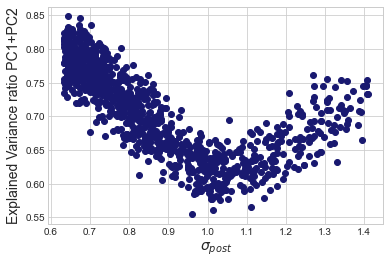

In [47]:
plt.scatter(
    sigma_post_list,
    pca_two_dim_list,
    color='midnightblue',
)

plt.xlabel(r'$\sigma_{post}$', fontsize=14)
plt.ylabel('Explained Variance ratio PC1+PC2', fontsize=14)

plt.savefig('figures/1105_20_1_pc12.png', dpi=150)

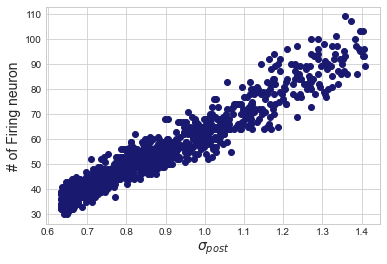

In [48]:
plt.scatter(
    sigma_post_list,
    firing_neuron_list,
    color='midnightblue',
)

plt.xlabel(r'$\sigma_{post}$', fontsize=14)
plt.ylabel('# of Firing neuron', fontsize=14)

plt.savefig('figures/1105_20_1_firing_neurons.png', dpi=150)

In [31]:
len(neural_dynamics[sigma_id, 30][neural_dynamics[sigma_id][30] > 1e-5])

65

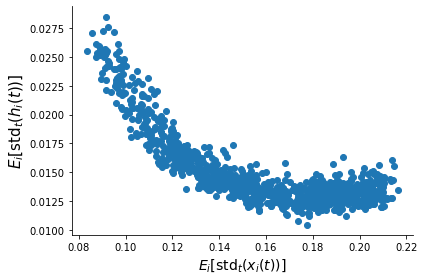

In [23]:
plt.scatter(
    np.mean(np.std(input_signal[:, :, :], axis=1), axis=1),
    np.mean(np.std(neural_dynamics[:, :, :], axis=1), axis=1),
)
# plt.xlim([0, 1.5])

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel(r'$E_i [{\rm std}_t (x_i(t))]$', fontsize=14)
plt.ylabel(r'$E_i [{\rm std}_t (h_i(t))]$', fontsize=15)
# plt.ylim([0, 1.6])
plt.tight_layout()
# plt.savefig('figures/20_1_input_hidden_scatter.eps', dpi=150)

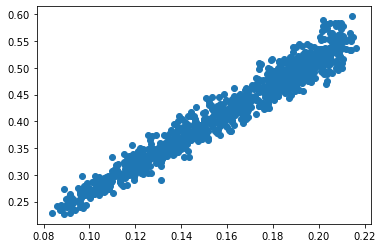

In [24]:
plt.scatter(
    np.mean(np.std(input_signal[:, :, :], axis=1), axis=1),
    np.mean(np.std(model.w_in(inputs).detach().numpy(), axis=1), axis=1),
)

plt.show()

model_name:  20_1


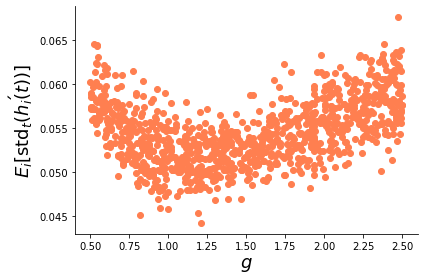

In [25]:
model_name = os.path.splitext(os.path.basename(config_path))[0]
print('model_name: ', model_name)

if 'ALPHA' not in cfg['MODEL'].keys():
    cfg['MODEL']['ALPHA'] = 0.25
    
# cfg['MODEL']['SIGMA_NEU'] = 0.05
cfg['DATALOADER']['TIME_LENGTH'] = 60

model = RecurrentNeuralNetwork(n_in=200, n_out=1, n_hid=cfg['MODEL']['SIZE'], device=device,
                               alpha_time_scale=cfg['MODEL']['ALPHA'],
                               activation=cfg['MODEL']['ACTIVATION'],
                               sigma_neu=cfg['MODEL']['SIGMA_NEU'],
                               use_bias=cfg['MODEL']['USE_BIAS'],
                               ffnn=False).to(device)

model_path = f'../trained_model/cue_combination_sampling/{model_name}/epoch_1000.pth'
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()


plt.scatter(
    1 / np.array(sigma_post_list) ** 2, 
    np.mean(np.std(torch.nn.ReLU()(model.w_in(inputs)).detach().numpy(), axis=1), axis=1),
    color='coral',
)
# plt.xlim([0, 1.5])

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel(r'$g$', fontsize=18)
plt.ylabel(r'$E_i [{\rm std}_t (h_i\'(t))]$', fontsize=18)

plt.tight_layout()
# plt.savefig('figures/20_1_g_hidden_scatter.png', dpi=150)


plt.show()

In [28]:
torch.nn.ReLU()(model.w_in(inputs)).detach().numpy().shape

(1000, 60, 200)

In [31]:
np.array(sigma_post_list).shape

(1000,)

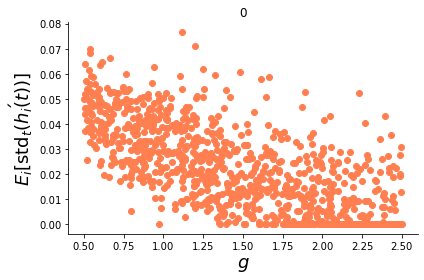

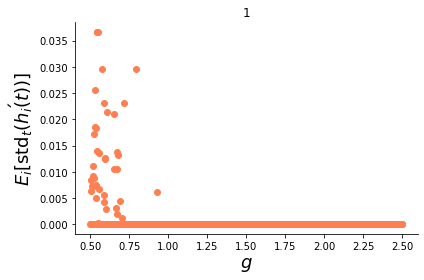

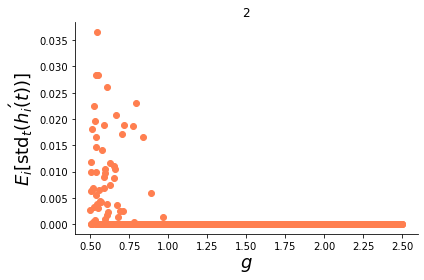

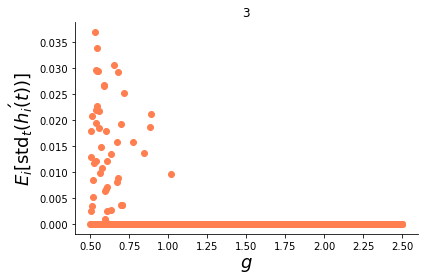

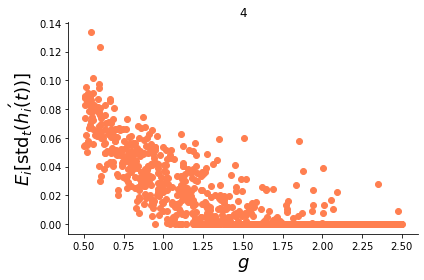

...

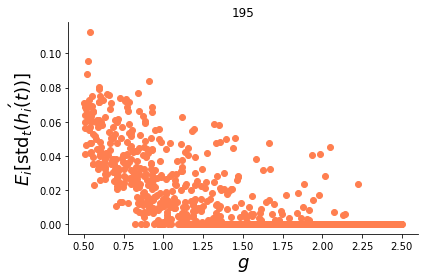

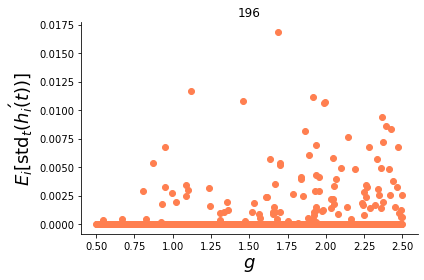

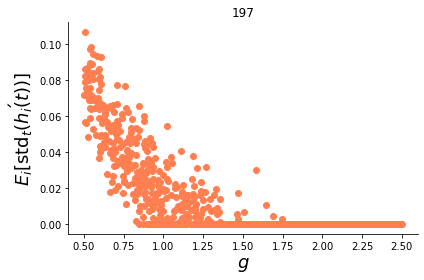

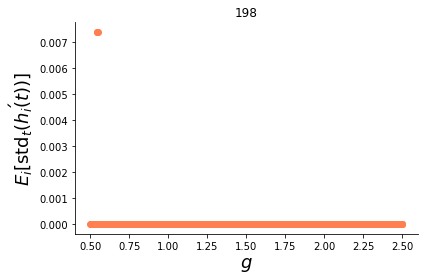

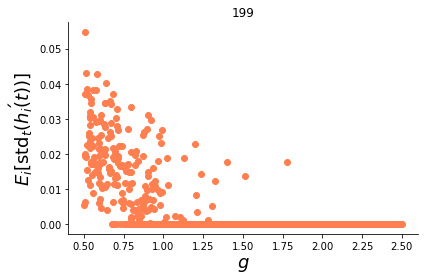

In [36]:
for i in range(200):
    plt.scatter(
        1 / np.array(sigma_post_list) ** 2, 
        np.std(torch.nn.ReLU()(model.w_in(inputs)).detach().numpy()[:, :, i], axis=1),
        color='coral',
    )

    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().yaxis.set_ticks_position('left')
    plt.gca().xaxis.set_ticks_position('bottom')

    plt.xlabel(r'$g$', fontsize=18)
    plt.ylabel(r'$E_i [{\rm std}_t (h_i\'(t))]$', fontsize=18)
    plt.title(i)
    plt.tight_layout()
    
# plt.savefig('figures/20_1_g_hidden_scatter.png', dpi=150)


    plt.show()

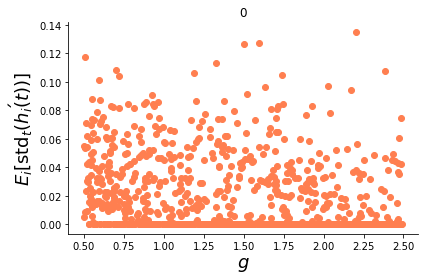

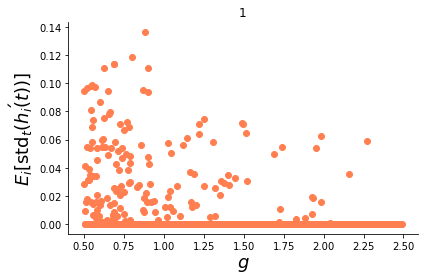

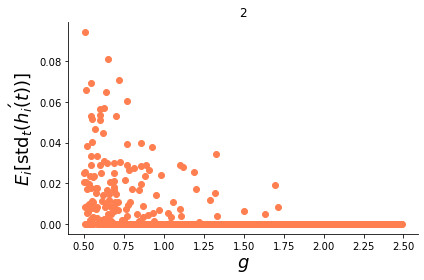

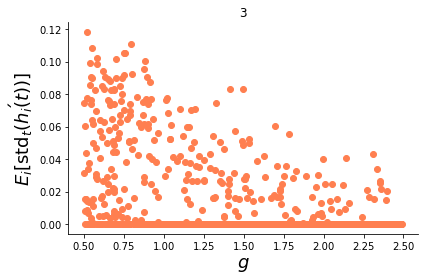

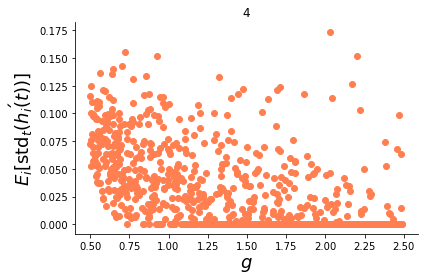

...

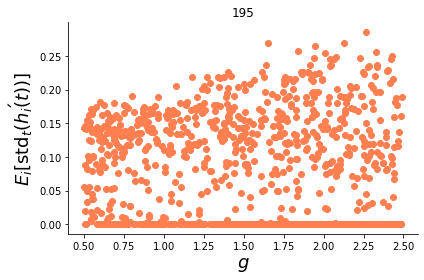

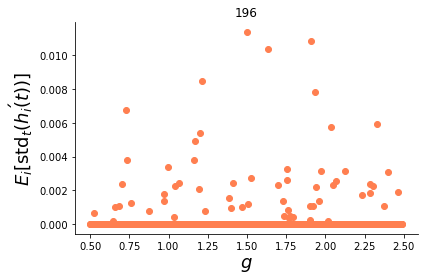

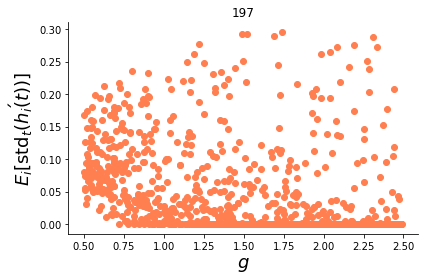

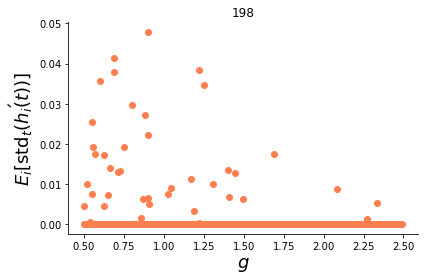

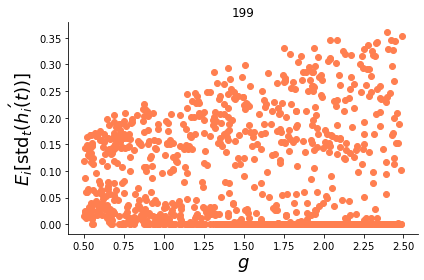

In [39]:
sample_num = 1000

outputs_np = np.zeros(sample_num)
input_signal, mu_post_list, sigma_post_list = make_signal_cc_task(sample_num, 
                                                                  time_length=cfg['DATALOADER']['TIME_LENGTH'], 
                                                                  mu_min=-15,
                                                                  mu_max=15,
                                                                  uncertainty=cfg['DATALOADER']['UNCERTAINTY'],
                                                                  fix_input=False)
input_signal_split = np.split(input_signal, sample_num // cfg['TRAIN']['BATCHSIZE'])

neural_dynamics = np.zeros((sample_num, cfg['DATALOADER']['TIME_LENGTH'], model.n_hid))                                                                        

hidden_np = np.zeros((sample_num, cfg['MODEL']['SIZE']))
hidden = torch.from_numpy(hidden_np).float()                               
hidden = hidden.to(device)                                                                             
inputs = torch.from_numpy(input_signal).float()                                               
inputs = inputs.to(device)                                                                             
hidden_list, outputs, _ = model(inputs, hidden, cfg['DATALOADER']['TIME_LENGTH'])                                                     
neural_dynamics = hidden_list.cpu().detach().numpy()                          
# outputs_np[i * cfg['TRAIN']['BATCHSIZE']: (i + 1) * cfg['TRAIN']['BATCHSIZE']] = outputs.detach().numpy()[:, -1, 0]
# neural_dynamics[i * cfg['TRAIN']['BATCHSIZE']: (i + 1) * cfg['TRAIN']['BATCHSIZE']] = hidden_list_np   

for i in range(200):
    plt.scatter(
        1 / np.array(sigma_post_list) ** 2, 
        np.std(torch.nn.ReLU()(model.w_in(inputs)).detach().numpy()[:, :, i], axis=1),
        color='coral',
    )

    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().yaxis.set_ticks_position('left')
    plt.gca().xaxis.set_ticks_position('bottom')

    plt.xlabel(r'$g$', fontsize=18)
    plt.ylabel(r'$E_i [{\rm std}_t (h_i\'(t))]$', fontsize=18)
    plt.title(i)
    plt.tight_layout()
    
# plt.savefig('figures/20_1_g_hidden_scatter.png', dpi=150)


    plt.show()

In [26]:
from scipy.stats import pearsonr

pearson_corr = pearsonr(
    1 / np.array(sigma_post_list) ** 2, 
    np.mean(np.std(torch.nn.ReLU()(model.w_in(inputs)).detach().numpy(), axis=1), axis=1),
)

print(pearson_corr)

(0.331800135237146, 3.993195615568742e-27)


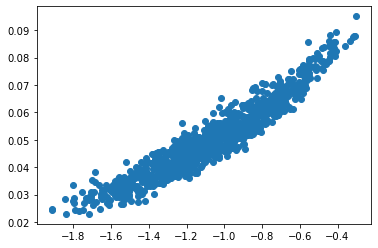

In [128]:
new_w_in_weight = np.random.normal(-0.0562, 0.1123, 200**2).reshape(200, 200)
new_w_in_bias = np.random.normal(0.12, 0.21, 200)

model.w_in.weight = torch.nn.Parameter(torch.from_numpy(new_w_in_weight).float())
model.w_in.bias = torch.nn.Parameter(torch.from_numpy(new_w_in_bias).float())

plt.scatter(
    np.mean(np.mean((model.w_in(inputs)).detach().numpy(), axis=1), axis=1),
    np.mean(np.std(torch.nn.ReLU()(model.w_in(inputs)).detach().numpy(), axis=1), axis=1),
)

plt.show()


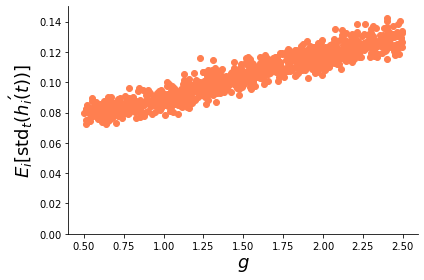

In [48]:
sample_num = 1000

outputs_np = np.zeros(sample_num)
input_signal, mu_post_list, sigma_post_list = make_signal_cc_task(sample_num, 
                                                                  time_length=cfg['DATALOADER']['TIME_LENGTH'], 
                                                                  mu_min=20,
                                                                  mu_max=20,
                                                                  uncertainty=cfg['DATALOADER']['UNCERTAINTY'],
                                                                  fix_input=False)
input_signal_split = np.split(input_signal, sample_num // cfg['TRAIN']['BATCHSIZE'])

neural_dynamics = np.zeros((sample_num, cfg['DATALOADER']['TIME_LENGTH'], model.n_hid))                                                                        

hidden_np = np.zeros((sample_num, cfg['MODEL']['SIZE']))
hidden = torch.from_numpy(hidden_np).float()                               
hidden = hidden.to(device)                                                                             
inputs = torch.from_numpy(input_signal).float()                                               
inputs = inputs.to(device)                                                                             
hidden_list, outputs, _ = model(inputs, hidden, cfg['DATALOADER']['TIME_LENGTH'])                                                     
neural_dynamics = hidden_list.cpu().detach().numpy()    

plt.scatter(
    1 / np.array(sigma_post_list) ** 2, 
    np.mean(np.std(torch.nn.ReLU()(model.w_in(inputs)).detach().numpy(), axis=1), axis=1),
    color='coral',
)
# plt.xlim([0, 1.5])

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel(r'$g$', fontsize=18)
plt.ylabel(r'$E_i [{\rm std}_t (h_i\'(t))]$', fontsize=18)

plt.ylim([0, 0.15])
plt.tight_layout()
# plt.savefig('figures/19_1_g_hidden_scatter.png', dpi=150)


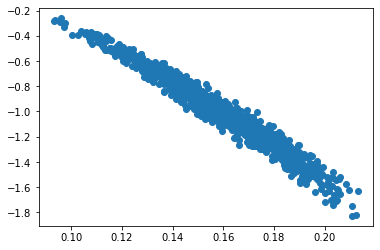

In [109]:
plt.scatter(
    np.mean(np.std(input_signal[:, :, :], axis=1), axis=1),
    np.mean(np.mean(model.w_in(inputs).detach().numpy(), axis=1), axis=1),
)

plt.show()

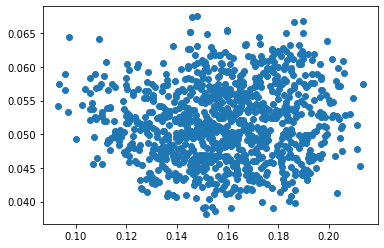

In [115]:
plt.scatter(
    np.mean(np.std(input_signal[:, :, :], axis=1), axis=1),
    np.mean(np.std(torch.nn.ReLU()(model.w_in(inputs)).detach().numpy(), axis=1), axis=1),
)

plt.show()

Text(0, 0.5, 'std of y(t)')

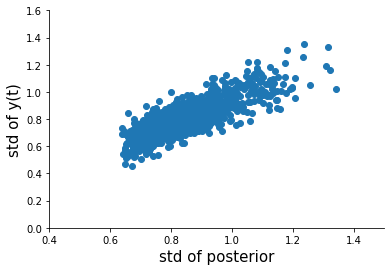

In [11]:
# plt.scatter(sigma_post_list, np.std(outputs.detach().numpy()[:, 20:, 0], axis=1))
plt.scatter(sigma_post_list, np.std(outputs.detach().numpy()[:, 20:, 0], axis=1))
plt.xlim([0.4, 1.5])
plt.ylim([0, 1.6])

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel('std of posterior', fontsize=15)
plt.ylabel('std of y(t)', fontsize=15)

# plt.savefig('figures/20_1_std_scatter.eps', dpi=150)

Text(0, 0.5, 'y(t)(output of NN)')

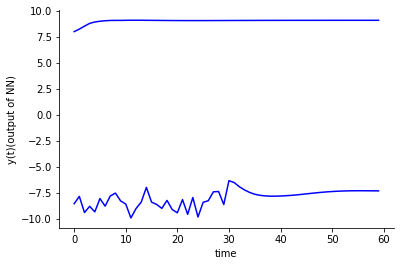

In [25]:
plt.plot(outputs_2.detach().numpy()[0, 0:, 0], color='blue')
plt.plot(outputs_fix.detach().numpy()[0, 0:, 0], color='blue')

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel('time')
plt.ylabel('y(t)(output of NN)')

# plt.savefig('figures/sample_of_output_NN.eps', dpi=150)

In [240]:
target_sample = np.random.normal(mu_post_list[0], sigma_post_list[0], 1000)

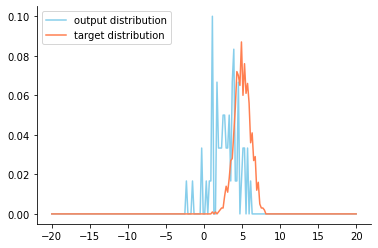

In [284]:
plt.plot(np.linspace(-20, 20, 200),
         np.histogram(outputs.detach().numpy()[0, :, 0], bins=200, range=(-20, 20))[0]/60, color='skyblue',
         label='output distribution')
plt.plot(np.linspace(-20, 20, 200),
         np.histogram(target_sample, bins=200, range=(-20, 20))[0]/1000, color='coral',
         label='target distribution')

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.legend()

# plt.savefig('figures/sample_of_distribution2.eps', dpi=150)

Text(0, 0.5, 'std of y(t)')

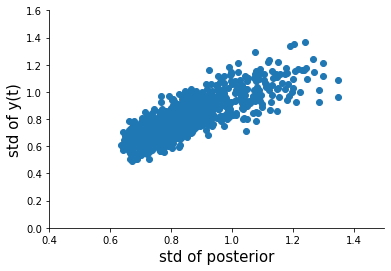

In [74]:
# plt.scatter(sigma_post_list, np.std(outputs.detach().numpy()[:, 20:, 0], axis=1))
plt.scatter(sigma_post_list, np.std(outputs.detach().numpy()[:, 20:, 0], axis=1))
plt.xlim([0.4, 1.5])
plt.ylim([0, 1.6])

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel('std of posterior', fontsize=15)
plt.ylabel('std of y(t)', fontsize=15)

# plt.savefig('figures/20_1_std_scatter.eps', dpi=150)

Text(0, 0.5, 'avg of y(t)')

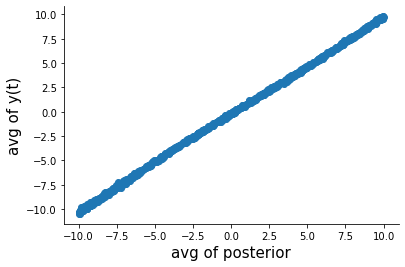

In [27]:
plt.scatter(
    mu_post_list, 
    np.mean(outputs.detach().numpy()[:, :, 0], axis=1),
)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel('avg of posterior', fontsize=15)
plt.ylabel('avg of y(t)', fontsize=15)

# plt.savefig('figures/20_1_avg_scatter.eps', dpi=150)

In [ ]:
plt.hist(model.w_in.weight.data.numpy(), bins=100)

(array([[0., 0., 0., ..., 2., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 array([-1.0872084 , -1.0726712 , -1.058134  , -1.0435969 , -1.0290596 ,
        -1.0145224 , -0.9999853 , -0.98544806, -0.9709109 , -0.9563737 ,
        -0.94183654, -0.9272993 , -0.9127621 , -0.89822495, -0.88368773,
        -0.8691506 , -0.85461336, -0.8400762 , -0.825539  , -0.81100184,
        -0.7964646 , -0.78192747, -0.76739025, -0.75285304, -0.7383159 ,
        -0.72377867, -0.7092415 , -0.6947043 , -0.68016714, -0.6656299 ,
        -0.65109277, -0.63655555, -0.6220184 , -0.6074812 , -0.59294397,
        -0.5784068 , -0.5638696 , -0.54933244, -0.5347952 , -0.52025807,
        -0.50572085, -0.49118367, -0.47664648, -0.4621093 , -0.4475721 ,
        -0.43303493, -0.41849774, -0.40396056, -0.38942337, -0.37488618,
        -0.360349  , 

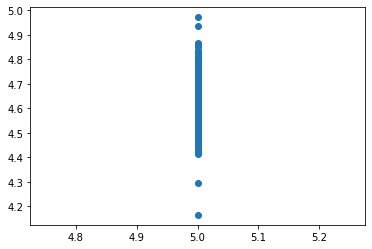

In [228]:
plt.scatter(mu_post_list, np.mean(outputs.detach().numpy()[:, :, 0], axis=1))
plt.show()

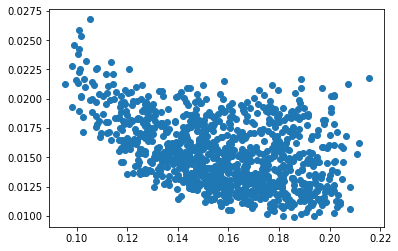

In [28]:
plt.scatter(
    np.mean(np.std(input_signal[:, :, :], axis=1), axis=1),
    np.mean(np.std(neural_dynamics[:, :, :], axis=1), axis=1),
)
# plt.xlim([0, 1.5])
# plt.ylim([0, 1.5])
plt.show()

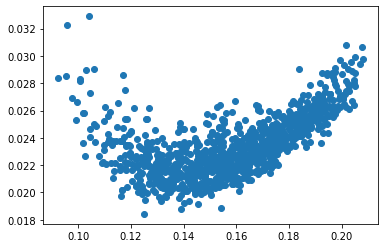

In [99]:
plt.scatter(
    np.mean(np.std(input_signal[:, :, :], axis=1), axis=1),
    np.mean(np.std(neural_dynamics[:, :, :], axis=1), axis=1),
)
# plt.xlim([0, 1.5])
# plt.ylim([0, 1.5])
plt.show()

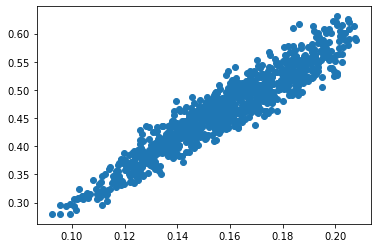

In [103]:
plt.scatter(
    np.mean(np.std(input_signal[:, :, :], axis=1), axis=1),
    np.mean(np.std(model.w_in(inputs).detach().numpy(), axis=1), axis=1),
)

plt.show()


In [29]:
from scipy.stats import pearsonr

pearson_corr = pearsonr(
    mu_post_list, 
    np.mean(outputs.detach().numpy()[:, 0:, 0], axis=1)
)

print(pearson_corr)

(0.9997511956851843, 0.0)


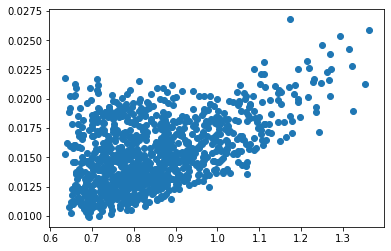

In [30]:
plt.scatter(
    sigma_post_list,
    np.mean(np.std(neural_dynamics[:, :, :], axis=1), axis=1),
)
# plt.xlim([0, 1.5])
# plt.ylim([0, 1.5])
plt.show()

In [127]:
from scipy.stats import pearsonr

pearson_corr = pearsonr(
    sigma_post_list, 
    np.std(outputs.detach().numpy()[:, 0:, 0], axis=1)
)

print(pearson_corr)

(0.5116440572714632, 8.258569632648743e-68)


Text(0, 0.5, 'std of y(t)')

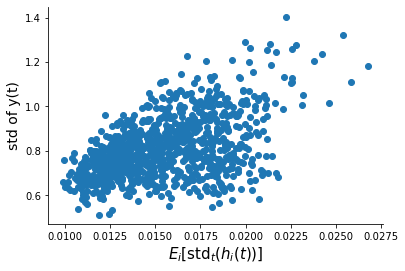

In [31]:
plt.scatter(
    np.mean(np.std(neural_dynamics[:, :, :], axis=1), axis=1),
    np.std(outputs.detach().numpy()[:, :, 0], axis=1),
)

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().yaxis.set_ticks_position('left')
plt.gca().xaxis.set_ticks_position('bottom')

plt.xlabel(r'$E_i [{\rm std}_t (h_i(t))]$', fontsize=15)
plt.ylabel('std of y(t)', fontsize=14)
# plt.savefig('figures/20_1_neuron_output_scatter.eps', dpi=150)

In [35]:
from scipy.stats import pearsonr

pearson_corr = pearsonr(
    np.mean(np.std(neural_dynamics[:, :, :], axis=1), axis=1),
    np.std(outputs.detach().numpy()[:, :, 0], axis=1)
)

print(pearson_corr)

(0.1460377, 3.5312016630781112e-06)


In [129]:
print(mu_post_list[1], sigma_post_list[1])
print(mu_post_list[2], sigma_post_list[2])
print(mu_post_list[4], sigma_post_list[4])
print(mu_post_list[9], sigma_post_list[9])


10.0 0.7858379367491044
10.0 0.7560404996832102
10.0 1.1181224657807887
9.999999999999998 0.7631714528042739


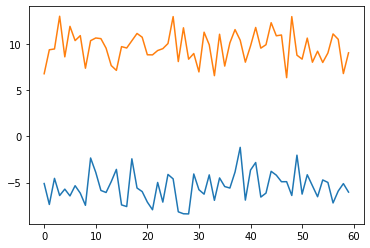

In [166]:
plt.plot(outputs.detach().numpy()[1, :, 0])
plt.plot(outputs.detach().numpy()[2, :, 0])
# plt.plot(outputs.detach().numpy()[4, :, 0])
# plt.plot(outputs.detach().numpy()[9, :, 0])

In [131]:
print(np.std((outputs.detach().numpy()[1, :, 0])))
print(np.std((outputs.detach().numpy()[2, :, 0])))

0.108654335
0.2224587


In [132]:
np.mean(np.sum((neural_dynamics>0)[:, :, :], axis=2), axis=1).shape

(1000,)

In [41]:
len(sigma_post_list)


500

In [42]:
neural_dynamics.shape

(1000, 60, 200)

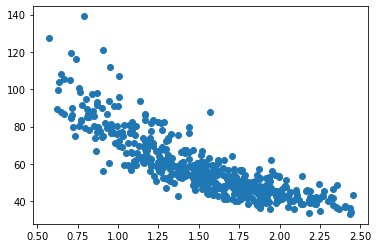

In [44]:
plt.scatter(
    1 / np.array(sigma_post_list) ** 2, 
    np.mean(np.sum((neural_dynamics>0)[:, :, :], axis=2), axis=1),
)
plt.show()

In [134]:
from scipy.stats import pearsonr

pearsonr(
    1 / np.array(sigma_post_list) ** 2, 
    np.mean(np.sum((neural_dynamics>0)[:, 20:, :], axis=2), axis=1),
)

(-0.6975932253514602, 1.1490963546885535e-146)

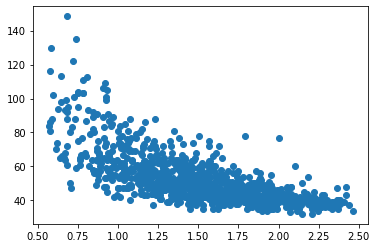

In [135]:
plt.scatter(
    1 / np.array(sigma_post_list) ** 2, 
    np.mean(np.sum((neural_dynamics>0)[:, 20:, :], axis=2), axis=1),
)
plt.show()

In [136]:
print(sigma_post_list[4])
print(sigma_post_list[5])

1.1181224657807887
0.7496221119964616


In [141]:
print(np.std(outputs.detach().numpy()[4, 40:, 0]))
print(np.std(outputs.detach().numpy()[5, 40:, 0]))


0.0007162077
0.0014810635


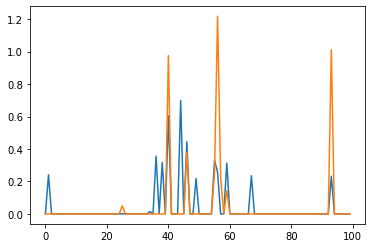

In [142]:
plt.plot(np.mean(neural_dynamics[4, 40:, 100:200], axis=0))
plt.plot(np.mean(neural_dynamics[5, 40:, 100:200], axis=0))

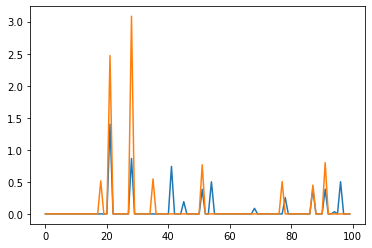

In [143]:
plt.plot(np.mean(neural_dynamics[4, 40:, 0:100], axis=0))
plt.plot(np.mean(neural_dynamics[5, 40:, 0:100], axis=0))

In [135]:
print(np.mean(np.std(neural_dynamics[4, :, :], axis=0)))
print(np.mean(np.std(neural_dynamics[5, :, :], axis=0)))

0.057364844
0.051794562


In [133]:
np.mean(model.w_hh.weight.data.numpy())

-0.02684968

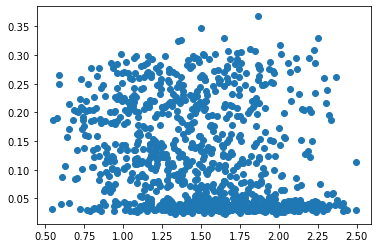

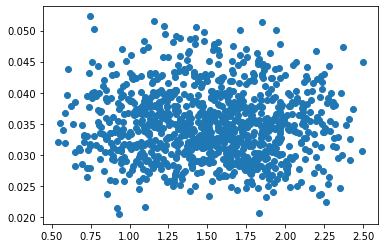

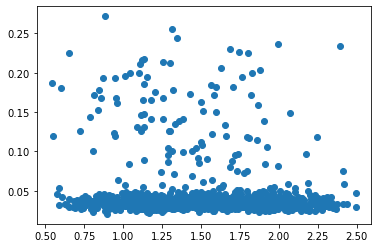

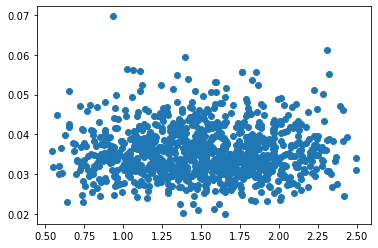

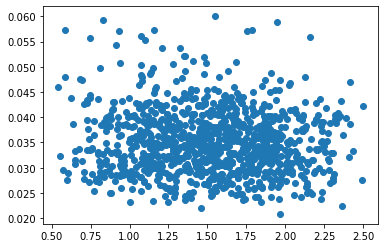

...

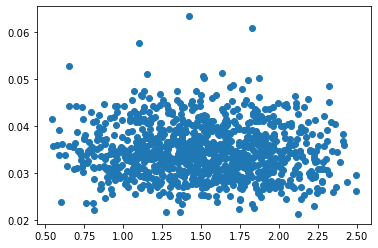

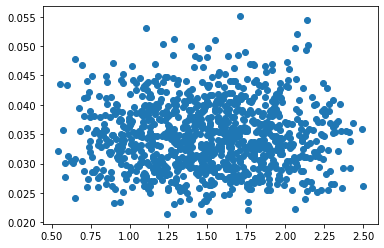

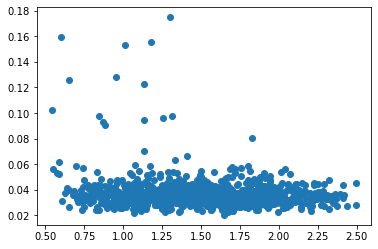

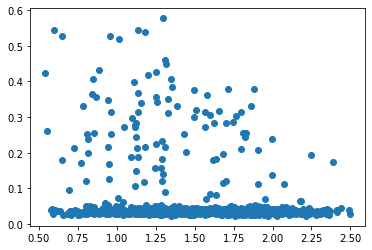

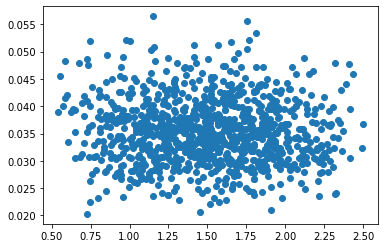

In [102]:
for i in range(200):
    plt.scatter(
        1 / np.array(sigma_post_list) ** 2, 
        np.std(neural_dynamics[:, :, i], axis=1),
    )
    plt.show()

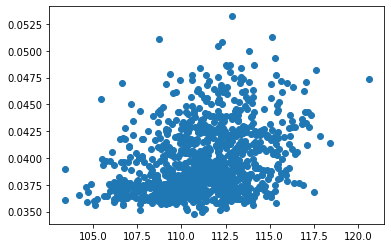

In [125]:
plt.scatter(
    np.mean(np.sum((neural_dynamics>0)[:, 20:, :], axis=2), axis=1),
    np.mean(np.std(neural_dynamics[:, 20:, :], axis=1), axis=1),
)
plt.show()

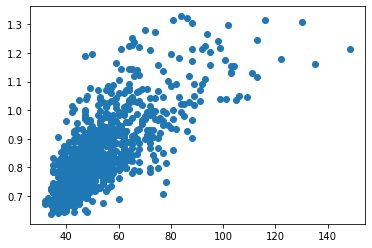

In [145]:
plt.scatter(
    np.mean(np.sum((neural_dynamics>0)[:, 20:, :], axis=2), axis=1),
    sigma_post_list,
)
plt.show()

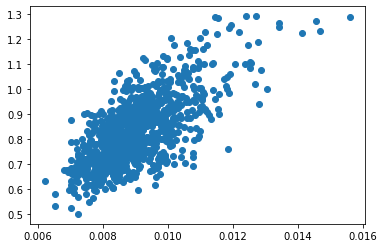

In [224]:
plt.scatter( 
    np.mean(np.std(neural_dynamics[:, 20:, :], axis=1), axis=1),
    np.std(outputs.detach().numpy()[:, 20:, 0], axis=1),
)
plt.show()

In [225]:
from scipy.stats import pearsonr

pearson_corr = pearsonr(
    np.mean(np.std(neural_dynamics[:, 20:, :], axis=1), axis=1),
    np.std(outputs.detach().numpy()[:, 20:, 0], axis=1),
)

print(pearson_corr)

(0.69871694, 2.4904708090124735e-147)


In [59]:
from scipy.stats import pearsonr

pearsonr(
    np.mean(np.sum((neural_dynamics>0)[:, 20:, :], axis=2), axis=1),
    sigma_post_list,
)

(0.24880373378551537, 1.4178055452489953e-15)

In [58]:
from scipy.stats import pearsonr

pearsonr(
    np.mean(np.sum((neural_dynamics>0)[:, 20:, :], axis=2), axis=1),
    np.std(outputs.detach().numpy()[:, 20:, 0], axis=1),
)

(-0.2081105032751517, 3.0179188970077526e-11)

In [22]:
from scipy.stats import norm

outputs_np = outputs.detach().numpy()[:, :, 0]
kl_div = 0
eps=1e-10
n = np.linspace(-20, 20, 40)
for i in range(sample_num):
    q = np.histogram(outputs_np[i], bins=40, range=(-20, 20))[0] / 60
    p = []
    for j in range(len(n)):
        p.append(norm.pdf(x=n[j], loc=mu_post_list[i], scale=sigma_post_list[i]))
        
    kl_div += np.sum([qi * np.log(qi / (pi + eps) + eps) for qi, pi in zip(q, p)])
    
print(kl_div / sample_num)

0.3425195823440037
